<a href="https://colab.research.google.com/github/ipsit03/Track1/blob/master/Self_Driving_Car.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 30.39 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
ls track

driving_log.csv*  IMG/


In [ ]:
!pip3 install imgaug    #Imgaug is a Python library used for image augmentation, primarily in the context of machine learning and computer vision tasks. Image augmentation involves applying a variety of transformations to images, such as rotation, scaling, translation, flipping, cropping, and adjusting brightness, contrast, and color. These transformations are applied to generate new images from existing ones, which can help increase the diversity of the training data and improve the performance of machine learning models, especially deep learning models.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential #Sequential Model: Sequential is a linear stack of layers in Keras. It allows you to easily create models by simply adding layers one by one. It's a convenient way to build feedforward neural networks where data flows sequentially from one layer to the next.
from keras.optimizers import Adam #Training deep learning models
from keras.layers import Convolution2D,MaxPooling2D,Dropout,Flatten,Dense # reduces the dimensionality of the feature maps.
#extracts the most important features from the output of the convolutional layer and reduces computational complexity.
from imgaug import augmenters as iaa
import cv2 #image processing
import pandas as pd
import random
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg #reading,writing and displaying image


In [ ]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
def path_leaf(path): #This function cuts the front part like C:\Users
  head,tail=ntpath.split(path)
  return tail
data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
#For every set of images we are going to plot the steering angles
#on a histogram to visualize the distribution and see what the
#steering angles are most frequent throughout the recording

In [ ]:
num_bins=25 #divide the entire range into 25 intervals
hist,bins=np.histogram(data['steering'],num_bins)
print(bins) #values go from -1 to +1 as that's how our steering angles are distributed

[-0.8755194  -0.8030775  -0.73063561 -0.65819371 -0.58575182 -0.51330992
 -0.44086802 -0.36842613 -0.29598423 -0.22354234 -0.15110044 -0.07865854
 -0.00621665  0.06622525  0.13866714  0.21110904  0.28355094  0.35599283
  0.42843473  0.50087662  0.57331852  0.64576042  0.71820231  0.79064421
  0.8630861   0.935528  ]


In [ ]:
#Values are not centered around the value 0 which indicates that the it
#is not driving straight

<BarContainer object of 25 artists>

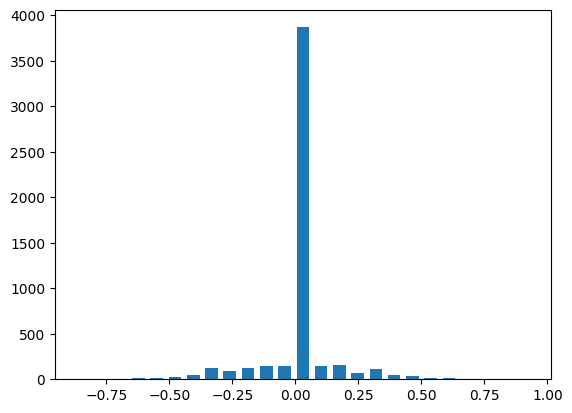

In [ ]:
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)


In [ ]:
#These values are centered along zero as computed
#The values are both distributed in left and right as we have drove equal over the
#left and right tracks.Data is balanced

In [ ]:
#Major drawback is majority data are centered over 0 which would make the model biased
#and have a problem during sharp turns

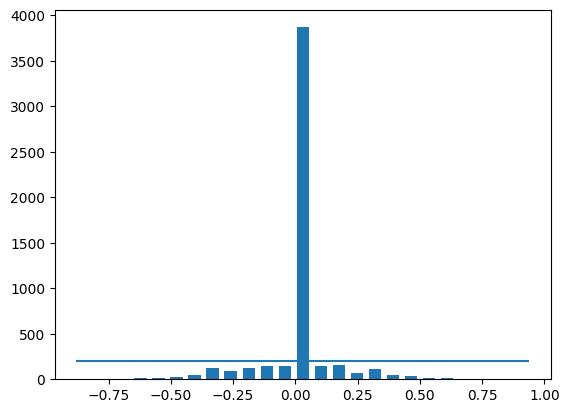

In [ ]:
samples_per_bin=200
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(samples_per_bin,samples_per_bin))

Total length: 5219
removed: 3669
Remainig data: 1550


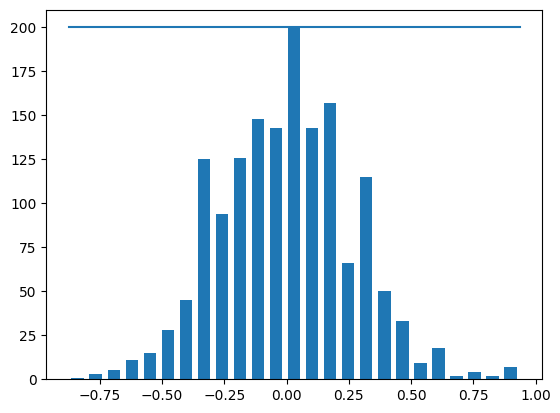

In [ ]:
#These all are preprocessing techniques
#This is how data is balanced so that the model does not misclassfies that the car
#always run through the middle of the road

print("Total length:",len(data))
remove_list=[]#samples we want to remove
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if (data['steering'][i] >= bins[j]) and (data['steering'][i] <= bins[j+1]):
       list_.append(i)
  list_=shuffle(list_)
  list_=list_[samples_per_bin:]
  remove_list.extend(list_)
print('removed:',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print("Remainig data:",len(data))

hist,_=np.histogram(data['steering'],(num_bins))
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(samples_per_bin,samples_per_bin))

In [ ]:
#Training and validation split
print(data.iloc[:1])
def load_img_steering(datadir,df): #data directory and dataframe
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i] #iloc allows us to perform a selection on a row of data from out data frame based on the specified index
    #In this case it will be the currrent index that's being iterated through indexed data would therefore contain a specific row of data at each iteration
    center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,center.strip())) #strip method eliminates aby string present
    steering.append(float(indexed_data[3])) #All the steering angle is appended
  image_paths=np.asarray(image_path) #The lists are converted to array so that they can be manipulated
  steerings=np.asarray(steering)
  return image_paths,steerings

image_paths,steerings=load_img_steering(datadir+'/IMG',data)

                                center                              left  \
13  center_2024_03_21_00_09_08_985.jpg  left_2024_03_21_00_09_08_985.jpg   

                                right  steering  throttle  reverse     speed  
13  right_2024_03_21_00_09_08_985.jpg  0.0       0.0       0.0      0.000079  


In [ ]:
X_train,X_valid,y_train,y_valid=train_test_split(image_paths,steerings,test_size=0.2,random_state=6)

In [ ]:
#After splitting all the data that we have collected from the simulation are now split into training
#and validation data.Each image for each set of data corresponding to a specific
#steering angle.

In [ ]:
print(len(X_train))
print(len(X_valid))

1240
310


Text(0.5, 1.0, 'Validation set')

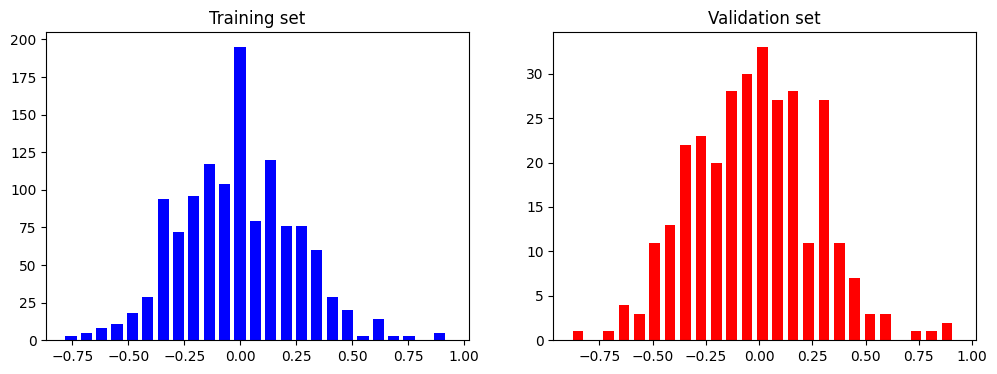

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')


In [ ]:
def zoom(image):
  zoom=iaa.Affine(scale=(1,1.3))
  image=zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

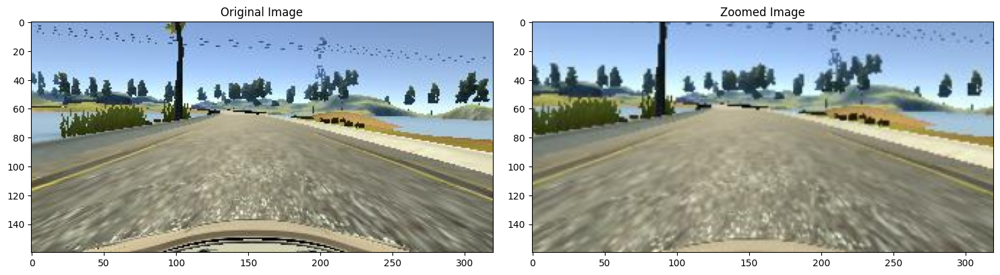

In [ ]:
image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()


axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

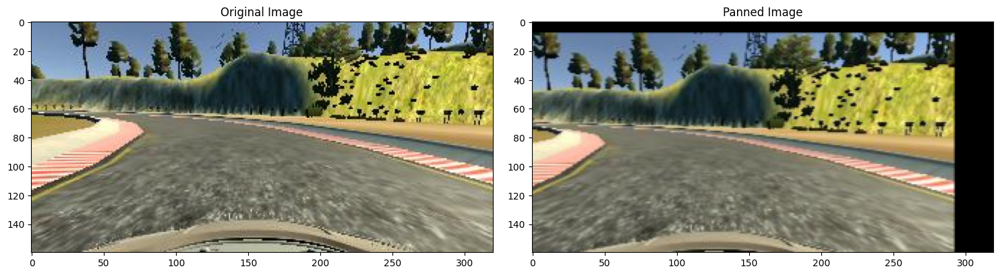

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

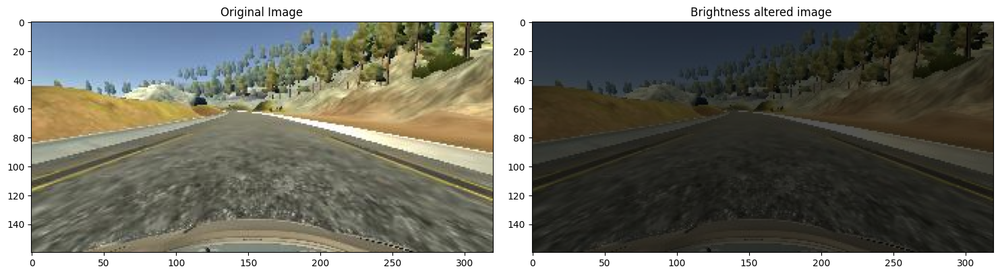

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

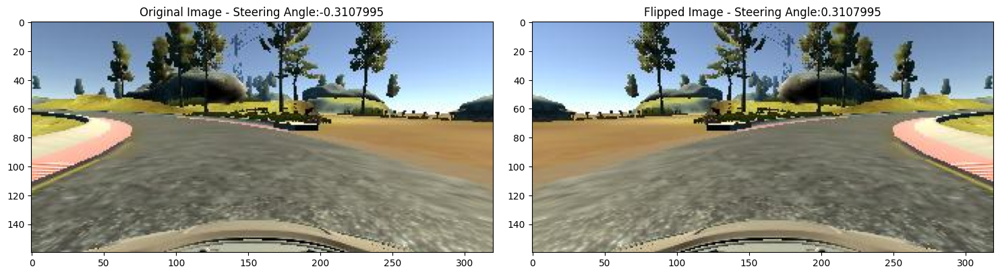

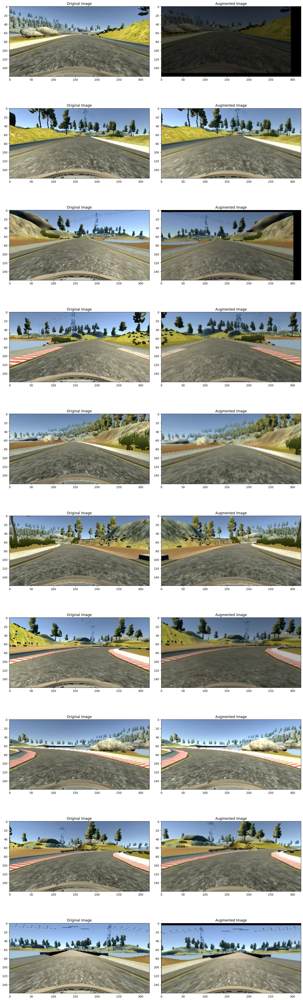

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
import cv2
import matplotlib.image as mpimg

def img_preprocess(img):
    img = img[60:135, :, :]  # Crop unnecessary parts of the image
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)  # Convert from RGB to YUV color space
    img = cv2.GaussianBlur(img, (3, 3), 0)  # Apply Gaussian blur
    img = cv2.resize(img, (200, 66))  # Resize the image
    img = img / 255.0  # Normalize the image
    return img

image_path = image_paths[100]  # Assuming image_paths is a list of image paths
original_image = mpimg.imread(image_path)  # Read the original image
preprocessed_image = img_preprocess(original_image)  # Preprocess the image

# Now you can use preprocessed_image for further processing or analysis


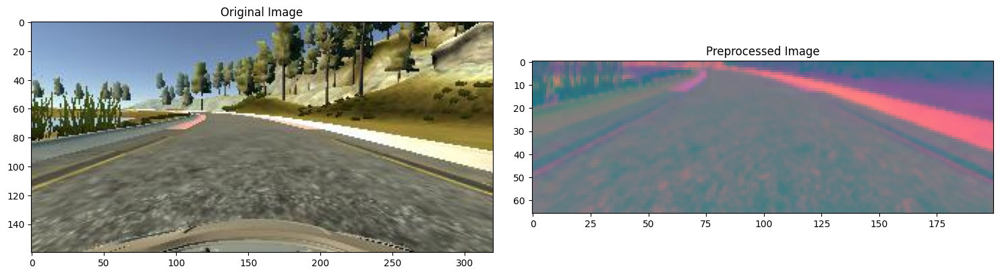

In [ ]:
import matplotlib.pyplot as plt




fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

plt.show()


In [ ]:
def batch_generator(image_paths,steering_ang,batch_size,istraining):
    while True:
      batch_img=[]
      batch_steering=[]
      for i in range(batch_size):
        random_index=random.randint(0,len(image_paths)-1)

        if istraining:
            im,steering= random_augment(image_paths[random_index],steering_ang[random_index])
        else:
            im=mpimg.imread(image_paths[random_index])
            steering=steering_ang[random_index]
        img=img_preprocess(im)
        batch_img.append(img)
        batch_steering.append(steering)
      yield(np.asarray(batch_img),np.asarray(batch_steering))

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

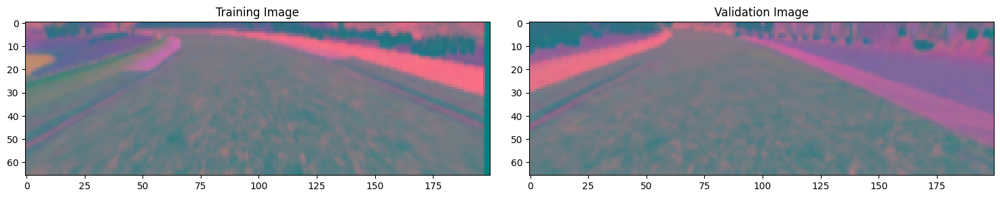

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

Defining Nvidia Model

In [ ]:
nvdia_arch='cnn_arch.png'
img = mpimg.imread(nvdia_arch)
plt.figure(figsize=(10, 7))
plt.imshow(img)

In [ ]:
def nvdia_model():
  model=Sequential()
  # model.add(Convolution2D(24,5,5,strides=(2,2),input_shape=(66,200,3),activation='relu'))
  # #Nvdia model uses 24 layers inside the network layer
  # #As our kernel moves horizontally it will move 2 pixels at a time
  # #As our kernel moves vertically it will move 2 pixels at a time
  # model.add(Convolution2D(36,5,5,strides=(2,2),activation='relu'))
  # model.add(Convolution2D(48,5,5,strides=(2,2),activation='relu'))
  # model.add(Convolution2D(64, 3, 3, activation='relu'))
  # model.add(Convolution2D(64, 3, 3, activation='relu'))
  # model.add(Dropout(0.5)) #Turn 50 percent of the data into 0

  model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))

  model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(1)) #This can correctly predict the steering angle
  optimizer=Adam(lr=0.001) #Relatively low learning rate as it will help to reduce the accuracy
  model.compile(loss='mse',optimizer=optimizer) #This is a regression type classifier so we will use 'mse'
  #Before going to the next step we will ensure that there is no overfitiing
  #Dropout layers set the input of a random fraction of nodes to zero during each update
  #This helps the model generalize the training data as it is forced to use a variety of combination
  #of nodes to learn from the same data
  return model

In [ ]:
model=nvdia_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 dropout_4 (Dropout)         (None, 1, 18, 64)         0         
                                                                 
 flatten_1 (Flatten)         (None, 1152)             

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-51-1380e7fdc075>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 304s 1s/step - loss: 0.0778 - val_loss: 0.0616
Epoch 2/10
300/300 [==============================] - 293s 976ms/step - loss: 0.0616 - val_loss: 0.0506
Epoch 3/10
300/300 [==============================] - 314s 1s/step - loss: 0.0572 - val_loss: 0.0531
Epoch 4/10
300/300 [==============================] - 292s 974ms/step - loss: 0.0551 - val_loss: 0.0455
Epoch 5/10
300/300 [==============================] - 289s 966ms/step - loss: 0.0527 - val_loss: 0.0486
Epoch 6/10
300/300 [==============================] - 286s 953ms/step - loss: 0.0523 - val_loss: 0.0493
Epoch 7/10
300/300 [==============================] - 289s 966ms/step - loss: 0.0520 - val_loss: 0.0469
Epoch 8/10
300/300 [==============================] - 311s 1s/step - loss: 0.0522 - val_loss: 0.0439
Epoch 9/10
300/300 [==============================] - 286s 953ms/step - loss: 0.0509 - val_loss: 0.0482
Epoch 10/10
300/300 [==============================] - 285s 950ms/step - 

Text(0.5, 0, 'Epoch')

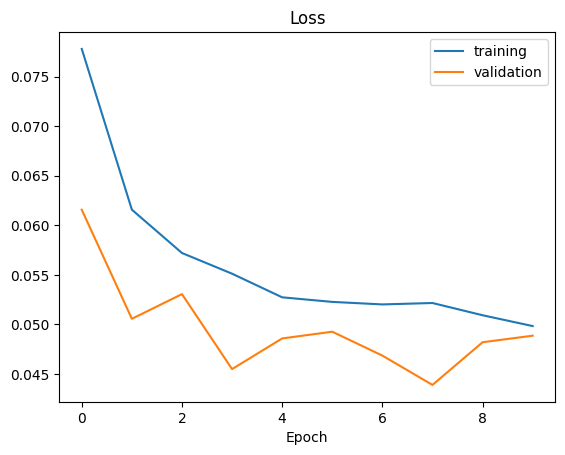

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download('model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Notes about Nvida model creation-
#model=Sequential() #Keras function aloows us to create ,models layer by layer
#where each layer has exactly one input tesnor and one output tensor

#    model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3), activation='elu'))
# model.add()- adds a layer to the neural network
#Convolution2D()-represents a 2D convolution layer.It convolves the input with a set of filters
#kernel_size=(5,5)=specifies the size of the convolution window
#strides(2,2)-defines the step size that the filter takes during convolution

#model.add(Flatten())-Layer converts the 2D matrix data to a vector
#This is necessary to transition from convolution layers to fully connected layers

    # model.add(Dense(100, activation='elu'))
    # model.add(Dropout(0.5))
  #Dense()- adds a fully connected layer with 100 neurons and 'elu' activation function
  #Dropout(0.5)-Randomly setys 50% of the input units to 0 at each update
   #during training.This helps prevent overfitting by forcing the model to learn multiple independent
   #representation of the same data
    #Adam is an optimization algorithm used to minimuze the loss function






































